In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf
import seaborn as sns
import pandas as pd
from collections import Counter
from PIL import Image
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report

In [10]:
ds_path = "/content/drive/MyDrive/Flower Classification-20250513T135137Z-1-001/Flower Classification/Train"

In [11]:

total_images = 0
for root, dirs, files in os.walk(ds_path):

  num_files = len(files)
  total_images += num_files
print("Total number of images:", total_images)


classes = os.listdir(ds_path)
images_per_class = {}
for class_name in classes:
  class_path = os.path.join(ds_path, class_name)
  if os.path.isdir(class_path):
    images_per_class[class_name] = len(os.listdir(class_path))
print("Total number of images per classes:", images_per_class)



Total number of images: 4312
Total number of images per classes: {'tulip': 983, 'daisy': 763, 'rose': 783, 'sunflower': 732, 'dandelion': 1051}


In [14]:
import os
class_names = sorted(os.listdir(ds_path))
if not class_names:
  print("No class directories found in the train folder!")
else:
  print(f"Found {len(class_names)} classes: {class_names}")

Found 5 classes: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


In [15]:
from PIL import Image, UnidentifiedImageError
import os

corrupted_images = []

for class_name in class_names:
    class_path = os.path.join(ds_path, class_name)
    print(f"Checking in: {class_path}")

    if os.path.isdir(class_path):
        images = os.listdir(class_path)
        for img_name in images:
            img_path = os.path.join(class_path, img_name)
            try:
                with Image.open(img_path) as img:
                    img.verify()
            except (IOError, UnidentifiedImageError):
                corrupted_images.append(img_path)
                print(f"Corrupted image detected: {img_path}")
                try:
                    os.remove(img_path)
                    print(f"Deleted: {img_path}")
                except Exception as e:
                    print(f"Failed to delete {img_path}: {e}")

if corrupted_images:
    print(f"\nTotal corrupted images deleted: {len(corrupted_images)}")
else:
    print("\nNo corrupted images found.")


Checking in: /content/drive/MyDrive/Flower Classification-20250513T135137Z-1-001/Flower Classification/Train/daisy
Corrupted image detected: /content/drive/MyDrive/Flower Classification-20250513T135137Z-1-001/Flower Classification/Train/daisy/2908212142_5437fa67ff_n.jpg
Deleted: /content/drive/MyDrive/Flower Classification-20250513T135137Z-1-001/Flower Classification/Train/daisy/2908212142_5437fa67ff_n.jpg
Corrupted image detected: /content/drive/MyDrive/Flower Classification-20250513T135137Z-1-001/Flower Classification/Train/daisy/2536529152_33ef3ee078_n.jpg
Deleted: /content/drive/MyDrive/Flower Classification-20250513T135137Z-1-001/Flower Classification/Train/daisy/2536529152_33ef3ee078_n.jpg
Corrupted image detected: /content/drive/MyDrive/Flower Classification-20250513T135137Z-1-001/Flower Classification/Train/daisy/4563059851_45a9d21a75.jpg
Deleted: /content/drive/MyDrive/Flower Classification-20250513T135137Z-1-001/Flower Classification/Train/daisy/4563059851_45a9d21a75.jpg
Corr

In [16]:
from collections import Counter
from PIL import Image

def image_shapes_summary(directory):
    shapes = []
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        for image_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, image_name)
            try:
                with Image.open(img_path) as img:
                    shapes.append(img.size)
            except:
                pass
    shape_counts = Counter(shapes)
    print("Image sizes and their frequencies:")
    for shape, count in shape_counts.items():
        print(f"{shape}: {count} images")

image_shapes_summary(ds_path)

Image sizes and their frequencies:
(320, 266): 5 images
(320, 213): 320 images
(180, 240): 153 images
(500, 335): 27 images
(320, 218): 10 images
(240, 159): 373 images
(500, 333): 597 images
(320, 240): 595 images
(182, 240): 3 images
(240, 240): 217 images
(159, 240): 139 images
(500, 372): 2 images
(320, 254): 9 images
(320, 211): 13 images
(500, 331): 54 images
(500, 281): 48 images
(214, 240): 4 images
(320, 212): 44 images
(240, 192): 10 images
(240, 239): 7 images
(500, 332): 118 images
(500, 327): 6 images
(240, 218): 4 images
(500, 375): 121 images
(320, 232): 9 images
(500, 273): 1 images
(500, 321): 4 images
(500, 300): 3 images
(209, 240): 2 images
(320, 215): 8 images
(500, 336): 4 images
(320, 264): 4 images
(500, 322): 9 images
(240, 150): 6 images
(163, 240): 3 images
(1024, 187): 1 images
(500, 310): 2 images
(196, 240): 3 images
(171, 240): 3 images
(320, 220): 8 images
(320, 214): 12 images
(240, 155): 4 images
(200, 240): 3 images
(320, 221): 6 images
(500, 210): 1 

In [17]:

def get_image_shapes(directory):
    shapes = []
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            for image_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, image_name)
                try:
                    with Image.open(img_path) as img:
                        shapes.append(img.size)
                except:
                    pass
    return Counter(shapes)


def analyze_and_plot_image_shapes(directory):
    shape_counts = get_image_shapes(directory)

    if not shape_counts:
        print("No valid image shapes found.")
        return


    data = []
    for (w, h), count in shape_counts.items():
        data.append([w, h, count])
    df = pd.DataFrame(data, columns=["width", "height", "count"])


    total_images = df["count"].sum()
    avg_width = int((df["width"] * df["count"]).sum() / total_images)
    avg_height = int((df["height"] * df["count"]).sum() / total_images)
    print(f"\n Suggested resize dimensions: ({avg_width}, {avg_height})")


    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df, x="width", y="height", size="count",
                    sizes=(40, 600), alpha=0.7, legend=False)
    plt.scatter(avg_width, avg_height, color='red', s=300, edgecolors='black', label=f"Suggested Avg Size ({avg_width}, {avg_height})")
    plt.title("Image Size Distribution")
    plt.xlabel("Width (pixels)")
    plt.ylabel("Height (pixels)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()




 Suggested resize dimensions: (338, 253)


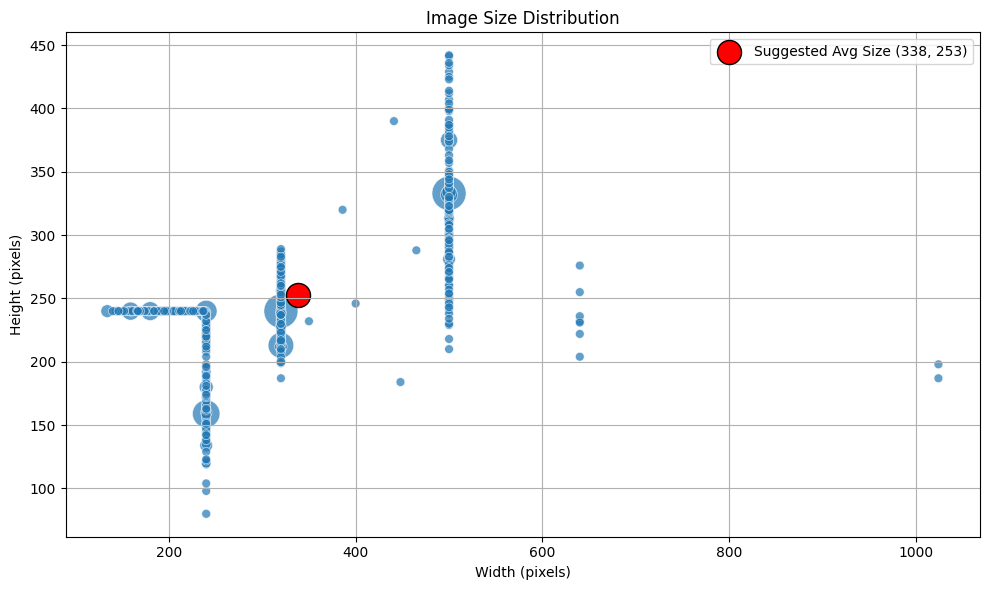

In [18]:
analyze_and_plot_image_shapes(ds_path)

In [19]:
import shutil
from tqdm import tqdm
from sklearn.model_selection import train_test_split

In [20]:

original_data_dir = '/content/drive/MyDrive/Flower Classification-20250513T135137Z-1-001/Flower Classification/Train'
output_base_dir = '/content/drive/MyDrive/Image CNN'
train_output_dir = os.path.join(output_base_dir, 'train')
test_output_dir = os.path.join(output_base_dir, 'test')

target_size = (300, 300)


for folder in [train_output_dir, test_output_dir]:
    os.makedirs(folder, exist_ok=True)


for class_name in os.listdir(original_data_dir):
    class_dir = os.path.join(original_data_dir, class_name)
    if not os.path.isdir(class_dir):
        continue


    image_paths = [os.path.join(class_dir, fname) for fname in os.listdir(class_dir)
                   if fname.lower().endswith(('.jpg', '.jpeg', '.png'))]


    train_imgs, test_imgs = train_test_split(image_paths, test_size=0.1, random_state=42)


    train_class_dir = os.path.join(train_output_dir, class_name)
    test_class_dir = os.path.join(test_output_dir, class_name)
    os.makedirs(train_class_dir, exist_ok=True)
    os.makedirs(test_class_dir, exist_ok=True)


    for img_path in tqdm(train_imgs, desc=f'Resizing train {class_name}'):
        try:
            img = Image.open(img_path).convert('RGB')
            img_resized = img.resize(target_size)
            img_resized.save(os.path.join(train_class_dir, os.path.basename(img_path)))
        except Exception as e:
            print(f"Error processing {img_path}: {e}")


    for img_path in tqdm(test_imgs, desc=f'Resizing test {class_name}'):
        try:
            img = Image.open(img_path).convert('RGB')
            img_resized = img.resize(target_size)
            img_resized.save(os.path.join(test_class_dir, os.path.basename(img_path)))
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

print("\nDataset has been resized and split into training and testing sets.")
print(f"Train dir: {train_output_dir}")
print(f"Test dir: {test_output_dir}")

Resizing test dandelion: 100%|██████████| 105/105 [00:01<00:00, 69.73it/s]


Dataset has been resized and split into training and testing sets.
Train dir: /content/drive/MyDrive/Image CNN/train
Test dir: /content/drive/MyDrive/Image CNN/test


In [22]:
resized_test_ds_path = "/content/drive/MyDrive/Image CNN/test"


total_images = 0
for root, dirs, files in os.walk(resized_test_ds_path):

  num_files = len(files)
  total_images += num_files
print("Total number of images:", total_images)


classes = os.listdir(resized_test_ds_path)
images_per_class = {}
for class_name in classes:
  class_path = os.path.join(resized_test_ds_path, class_name)
  if os.path.isdir(class_path):
    images_per_class[class_name] = len(os.listdir(class_path))
print("Total number of images per classes:", images_per_class)



Total number of images: 430
Total number of images per classes: {'tulip': 98, 'daisy': 76, 'rose': 78, 'sunflower': 73, 'dandelion': 105}


In [23]:
resized_train_ds_path = "/content/drive/MyDrive/Image CNN/train"


total_images = 0
for root, dirs, files in os.walk(resized_train_ds_path):

  num_files = len(files)
  total_images += num_files
print("Total number of images:", total_images)


classes = os.listdir(resized_train_ds_path)
images_per_class = {}
for class_name in classes:
  class_path = os.path.join(resized_train_ds_path, class_name)
  if os.path.isdir(class_path):
    images_per_class[class_name] = len(os.listdir(class_path))
print("Total number of images per classes:", images_per_class)



Total number of images: 3847
Total number of images per classes: {'tulip': 878, 'daisy': 680, 'rose': 698, 'sunflower': 652, 'dandelion': 939}


In [24]:


train_ds = tf.keras.utils.image_dataset_from_directory(
resized_train_ds_path,
batch_size=32,
image_size=(300, 300),
shuffle=True,
seed=123,
validation_split=0.2,
subset="training",
)


Found 3847 files belonging to 5 classes.
Using 3078 files for training.


In [25]:
val_ds = tf.keras.utils.image_dataset_from_directory(
resized_train_ds_path,
batch_size=32,
image_size=(300, 300),
shuffle=True,
seed=123,
validation_split=0.2,
subset="validation",
)


Found 3847 files belonging to 5 classes.
Using 769 files for validation.


In [26]:

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
])

In [27]:
import os
class_names = sorted(os.listdir(resized_train_ds_path))
if not class_names:
  print("No class directories found in the train folder!")
else:
  print(f"Found {len(class_names)} classes: {class_names}")

Found 5 classes: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


In [28]:
def show_augmented_images(dataset, data_augmentation, class_names):
    plt.figure(figsize=(12, 12))

    for images, labels in dataset.take(1):
        augmented_images = data_augmentation(images)

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(augmented_images[i].numpy().astype("uint8"))
            plt.title(f"Class: {class_names[labels[i].numpy()]}")
            plt.axis("off")

    plt.tight_layout()
    plt.show()

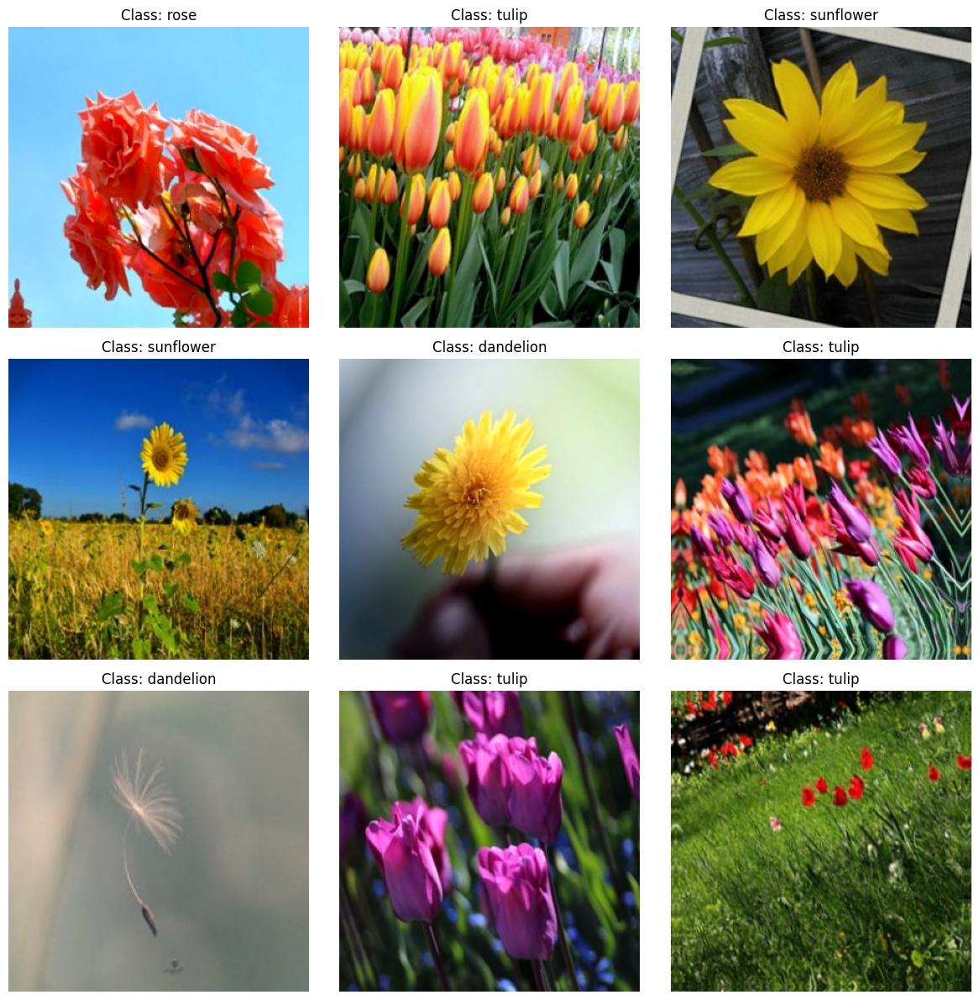

In [29]:
show_augmented_images(train_ds, data_augmentation, class_names)

<ipython-input-30-7bf178f6f971>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=data["Class"], y=data["Number of Images"], palette="Set2")


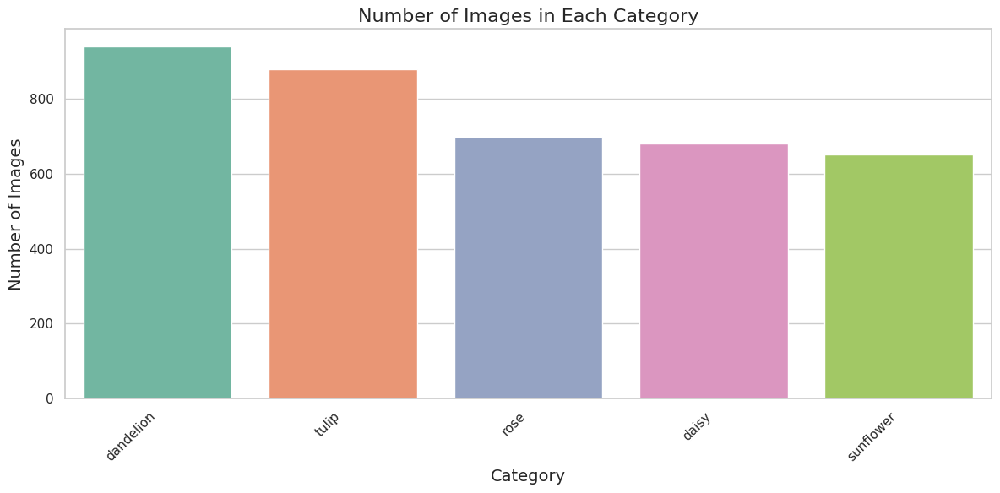

In [30]:

import matplotlib.pyplot as plt
import seaborn as sns

def plot_image_category_distribution(directory):
    categories = []

    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            num_images = len([image_name for image_name in os.listdir(class_dir) if image_name.lower().endswith('.jpg')])
            categories.append((class_name, num_images))

    categories.sort(key=lambda x: x[1], reverse=True)

    class_names, image_counts = zip(*categories)

    data = {"Class": class_names, "Number of Images": image_counts}

    sns.set(style="whitegrid", palette="muted")

    plt.figure(figsize=(12, 6))
    sns.barplot(x=data["Class"], y=data["Number of Images"], palette="Set2")

    plt.xticks(rotation=45, ha="right")

    plt.title("Number of Images in Each Category", fontsize=16)
    plt.xlabel("Category", fontsize=14)
    plt.ylabel("Number of Images", fontsize=14)

    plt.tight_layout()
    plt.show()

plot_image_category_distribution(resized_train_ds_path)


## Building model

In [31]:
def generate_model(image_height, image_width, nchannels, num_classes):
  baseline_model = tf.keras.Sequential([
      data_augmentation,

      layers.Rescaling(1./255, input_shape=(image_height,image_width, nchannels)),

      layers.Conv2D(32, (3,3), padding="same", activation="relu"),
      layers.MaxPooling2D(2,2),

      layers.Conv2D(64, (3,3), padding="same", activation="relu"),
      layers.MaxPooling2D(2,2),

      layers.Conv2D(128, (3,3), padding="same", activation="relu"),
      layers.MaxPooling2D(2,2),


      layers.Flatten(),
      layers.Dense(128, activation="relu"),
      layers.Dense(64, activation='relu'),
      layers.Dense(32, activation='relu'),
      layers.Dense(num_classes, activation='softmax')
  ])
  return baseline_model

In [32]:
batch_size = 32
img_height = 300
img_width = 300
dropout_rate = 0.2

In [33]:
num_classes = len(class_names)
cnn_model1 = generate_model(img_height, img_width, 3, num_classes)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [34]:
train_ds = train_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))
val_ds = val_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))

In [35]:
cnn_model1.compile(loss="categorical_crossentropy",optimizer="adam",metrics=["accuracy"])

In [36]:
cnn_model1.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (32, 300, 300, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (32, 150, 150, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (32, 75, 75, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (32, 175232)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (32, 128)              │    22,429,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (32, 64)               │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (32, 32)               │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (32, 5)                │           165 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,533,573 (85.96 MB)

 Trainable params: 22,533,573 (85.96 MB)

 Non-trainable params: 0 (0.00 B)

In [37]:
callbacks = [
keras.callbacks.ModelCheckpoint(filepath="model_at_epoch_{epoch}.keras"),
keras.callbacks.EarlyStopping(monitor="val_loss", patience=5 ),
]

In [38]:
epochs = 30
history = cnn_model1.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[callbacks]
)

Epoch 1/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - accuracy: 0.3368 - loss: 1.6844 - val_accuracy: 0.4928 - val_loss: 1.1387
Epoch 2/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 17s 176ms/step - accuracy: 0.5410 - loss: 1.1326 - val_accuracy: 0.6073 - val_loss: 1.0112
Epoch 3/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - accuracy: 0.6196 - loss: 0.9726 - val_accuracy: 0.6541 - val_loss: 0.9153
Epoch 4/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - accuracy: 0.6470 - loss: 0.9187 - val_accuracy: 0.6346 - val_loss: 0.8948
Epoch 5/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 18s 184ms/step - accuracy: 0.6495 - loss: 0.9008 - val_accuracy: 0.6554 - val_loss: 0.8729
Epoch 6/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 218ms/step - accuracy: 0.6833 - loss: 0.8316 - val_accuracy: 0.6892 - val_loss: 0.8204
Epoch 7/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - accuracy: 0.6934 - loss: 0.7835 - val_accuracy: 0.6866 - val_loss: 0.8092
Epoch 8/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - accuracy: 0.7075 - loss: 0.7556 - val_accu

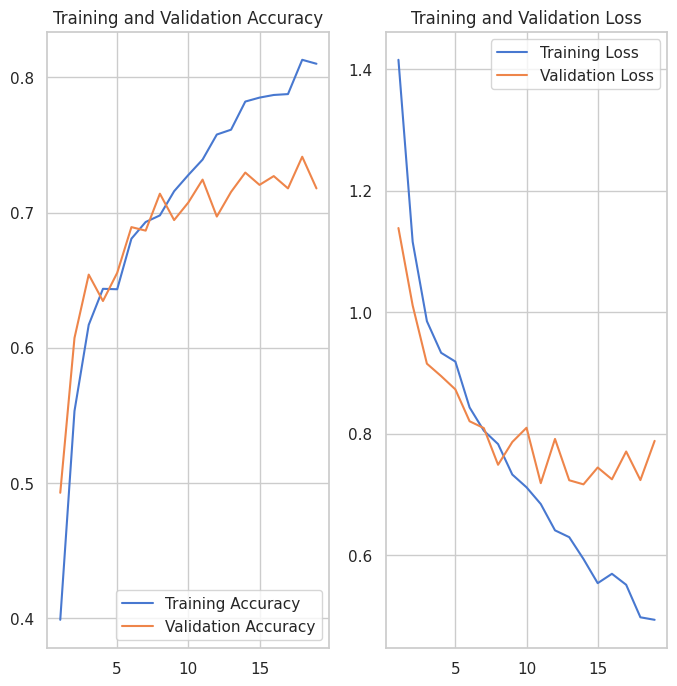

In [39]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']


epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [40]:
test_loss, test_accuracy = cnn_model1.evaluate(val_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - accuracy: 0.7107 - loss: 0.8015
Test Loss: 0.7881605625152588
Test Accuracy: 0.7178153395652771


Found 430 files belonging to 5 classes.
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - accuracy: 0.6949 - loss: 0.9028
Test Loss: 0.9278024435043335
Test Accuracy: 0.6906976699829102
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


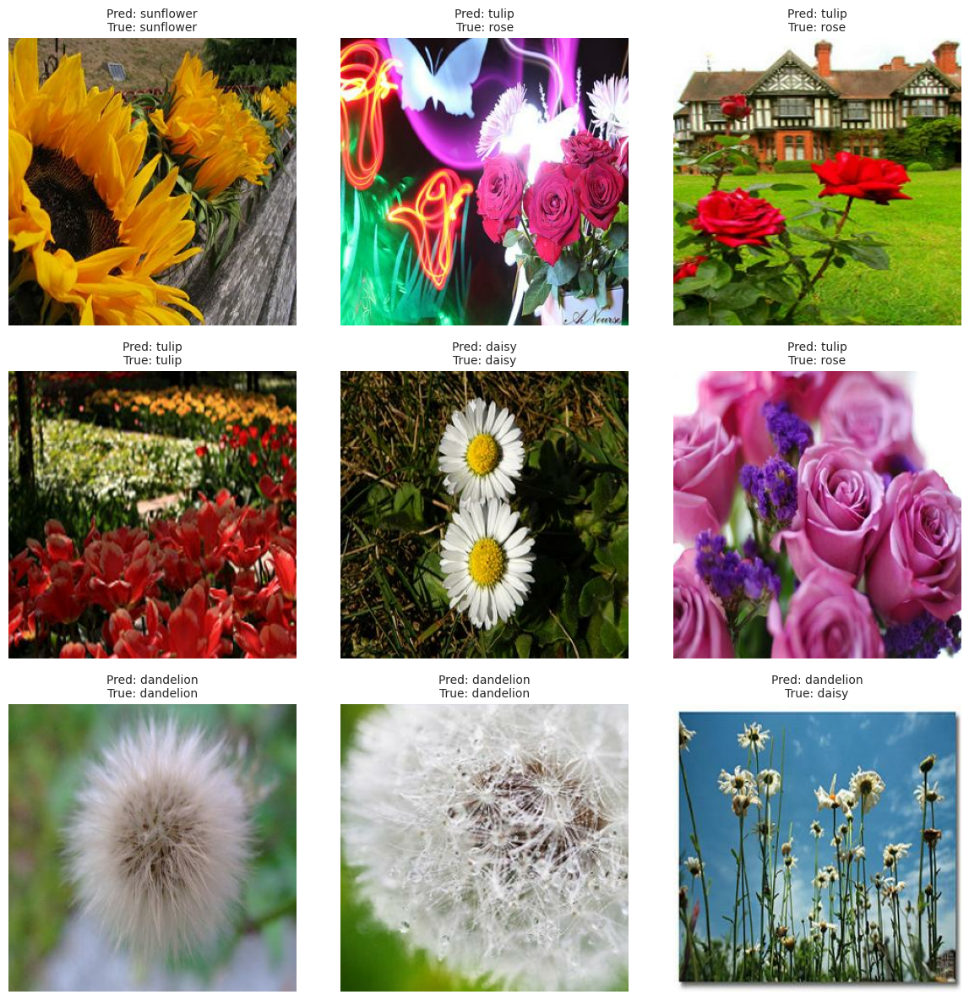

In [44]:

def predict_and_plot(model, dataset, class_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):

        predictions = model.predict(images)
        images = images.numpy()
        labels = labels.numpy()

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].astype("uint8"))

            predicted_label = class_names[np.argmax(predictions[i])]


            true_label_index = np.argmax(labels[i])
            true_label = class_names[true_label_index]

            plt.title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()


test_dir = "/content/drive/MyDrive/Image CNN/test"
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    batch_size=32,
    image_size=(300, 300),
    shuffle=True
)

test_ds = test_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))


test_loss, test_accuracy = cnn_model1.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)


predict_and_plot(cnn_model1, test_ds, class_names)


In [45]:
cnn_model1.save('model1_cnn.h5')

In [46]:
loaded_model = keras.models.load_model('model1_cnn.h5')
print("Model loaded for predictions")


all_images = []
all_labels = []
for images, labels in test_ds:
    all_images.append(images.numpy())
    all_labels.append(labels.numpy())


test_images = np.concatenate(all_images, axis=0)
test_labels_onehot = np.concatenate(all_labels, axis=0)


predictions = loaded_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_labels_onehot
if true_labels.ndim > 1:
    true_labels = np.argmax(true_labels, axis=1)


print(f"Class names: {class_names}")


report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", report)

Model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step
Class names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Report:
               precision    recall  f1-score   support

       daisy       0.85      0.58      0.69        76
   dandelion       0.83      0.77      0.80       105
        rose       0.51      0.59      0.55        78
   sunflower       0.81      0.77      0.79        73
       tulip       0.58      0.71      0.64        98

    accuracy                           0.69       430
   macro avg       0.71      0.68      0.69       430
weighted avg       0.71      0.69      0.70       430



## Regularized model

In [47]:
def generate_model(image_height, image_width, nchannels, num_classes):

  regularized_model = tf.keras.Sequential([
      data_augmentation,

      layers.Rescaling(1./255, input_shape=(image_height,image_width, nchannels)),

      layers.Conv2D(32, (3,3), padding="same", activation="relu"),
      layers.BatchNormalization(),
      layers.MaxPooling2D(2,2),
      layers.Dropout(0.2),

      layers.Conv2D(64, (3,3), padding="same", activation="relu"),
      layers.BatchNormalization(),
      layers.MaxPooling2D(2,2),
      layers.Dropout(0.2),

      layers.Conv2D(128, (3,3), padding="same", activation="relu"),
      layers.BatchNormalization(),
      layers.MaxPooling2D(2,2),
      layers.Dropout(0.2),


      layers.Conv2D(256, (3,3), padding="same", activation="relu"),
      layers.BatchNormalization(),
      layers.MaxPooling2D(2,2),
      layers.Dropout(0.2),


      layers.Flatten(),
      layers.Dense(256, activation='relu'),
      layers.BatchNormalization(),
      layers.Dense(128, activation="relu"),
      layers.BatchNormalization(),
      layers.Dense(64, activation='relu'),
      layers.Dropout(0.3),
      layers.Dense(num_classes, activation='softmax')
  ])
  return regularized_model

In [48]:
num_classes = len(class_names)
cnn_model2 = generate_model(img_height, img_width, 3, num_classes)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [49]:
cnn_model2.compile(loss="categorical_crossentropy",optimizer="sgd",metrics=["accuracy"])

In [50]:
cnn_model2.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (32, 300, 300, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (32, 300, 300, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (32, 150, 150, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (32, 150, 150, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (32, 75, 75, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (32, 75, 75, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (32, 37, 37, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (32, 37, 37, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (32, 82944)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (32, 256)              │    21,233,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (32, 256)              │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (32, 128)              │        32,896 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 21,667,269 (82.65 MB)

 Trainable params: 21,665,541 (82.65 MB)

 Non-trainable params: 1,728 (6.75 KB)

In [51]:
epochs = 50
history = cnn_model2.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[callbacks]
)

Epoch 1/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 36s 334ms/step - accuracy: 0.3666 - loss: 1.6831 - val_accuracy: 0.2380 - val_loss: 5.0714
Epoch 2/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 38s 315ms/step - accuracy: 0.5367 - loss: 1.1644 - val_accuracy: 0.2328 - val_loss: 4.0121
Epoch 3/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 316ms/step - accuracy: 0.5748 - loss: 1.0886 - val_accuracy: 0.2913 - val_loss: 4.9180
Epoch 4/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 31s 317ms/step - accuracy: 0.5890 - loss: 1.0149 - val_accuracy: 0.2575 - val_loss: 6.0745
Epoch 5/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 315ms/step - accuracy: 0.6056 - loss: 0.9943 - val_accuracy: 0.3368 - val_loss: 5.4389
Epoch 6/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 31s 320ms/step - accuracy: 0.6506 - loss: 0.9472 - val_accuracy: 0.3446 - val_loss: 6.7256
Epoch 7/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 40s 317ms/step - accuracy: 0.6468 - loss: 0.8937 - val_accuracy: 0.3394 - val_loss: 7.7344


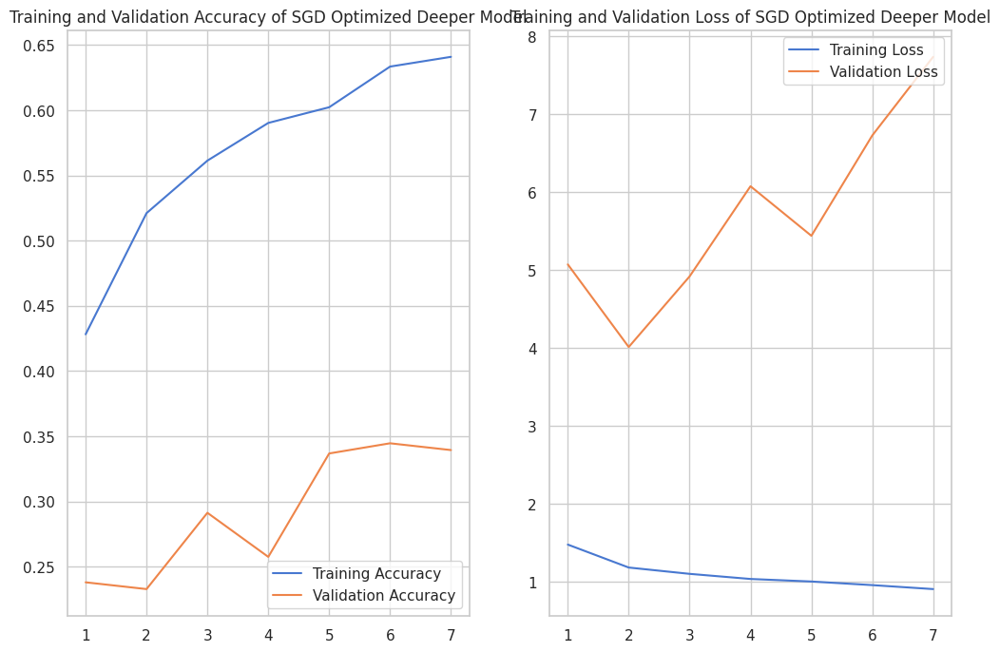

In [52]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']


epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy of SGD Optimized Deeper Model')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss of SGD Optimized Deeper Model')
plt.show()

In [53]:
test_loss, test_accuracy = cnn_model2.evaluate(val_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.3425 - loss: 8.0382
Test Loss: 7.734386920928955
Test Accuracy: 0.33940181136131287


14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - accuracy: 0.3325 - loss: 8.0354
Test Loss: 8.254801750183105
Test Accuracy: 0.3395348787307739
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


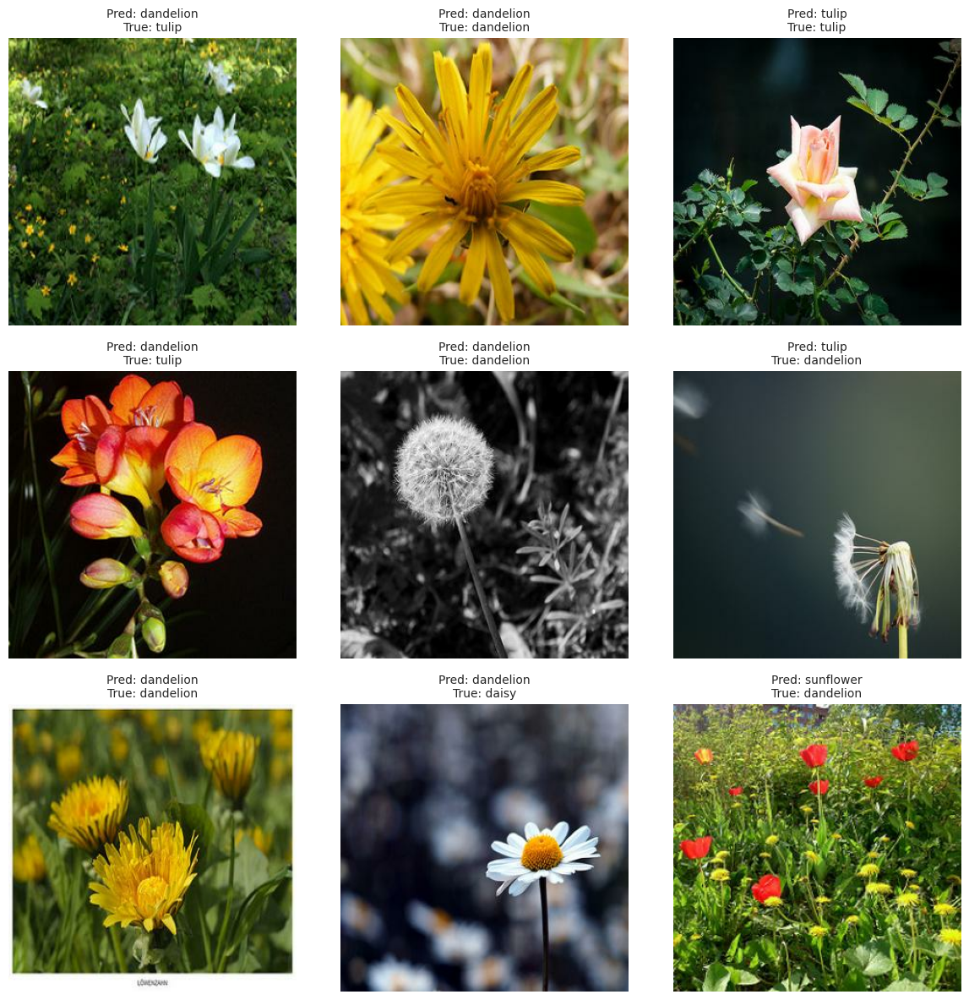

In [54]:


def predict_and_plot(model, dataset, class_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):

        predictions = model.predict(images)
        images = images.numpy()
        labels = labels.numpy()

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].astype("uint8"))

            predicted_label = class_names[np.argmax(predictions[i])]


            true_label_index = np.argmax(labels[i])
            true_label = class_names[true_label_index]
            plt.title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()


test_loss, test_accuracy = cnn_model2.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)


predict_and_plot(cnn_model2, test_ds, class_names)


In [55]:
cnn_model2.save('cnn_model_sgd.h5')

In [56]:
loaded_model = keras.models.load_model('cnn_model_sgd.h5')
print("Model loaded for predictions")


all_images = []
all_labels = []
for images, labels in test_ds:
    all_images.append(images.numpy())
    all_labels.append(labels.numpy())


test_images = np.concatenate(all_images, axis=0)
test_labels_onehot = np.concatenate(all_labels, axis=0)


predictions = loaded_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_labels_onehot
if true_labels.ndim > 1:
    true_labels = np.argmax(true_labels, axis=1)


print(f"Class names: {class_names}")


report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", report)

Model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step
Class names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Report:
               precision    recall  f1-score   support

       daisy       0.00      0.00      0.00        76
   dandelion       0.29      0.83      0.43       105
        rose       0.25      0.04      0.07        78
   sunflower       0.55      0.32      0.40        73
       tulip       0.41      0.34      0.37        98

    accuracy                           0.34       430
   macro avg       0.30      0.30      0.25       430
weighted avg       0.30      0.34      0.27       430



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [57]:
cnn_model2.compile(loss="categorical_crossentropy",optimizer="adam",metrics=["accuracy"])


In [58]:
cnn_model2.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (32, 300, 300, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (32, 300, 300, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (32, 150, 150, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (32, 150, 150, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (32, 75, 75, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (32, 75, 75, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (32, 37, 37, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (32, 37, 37, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (32, 82944)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (32, 256)              │    21,233,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (32, 256)              │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (32, 128)              │        32,896 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 21,667,269 (82.65 MB)

 Trainable params: 21,665,541 (82.65 MB)

 Non-trainable params: 1,728 (6.75 KB)

In [59]:
epochs = 50
history = cnn_model2.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[callbacks]
)

Epoch 1/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 42s 381ms/step - accuracy: 0.5144 - loss: 1.2756 - val_accuracy: 0.5865 - val_loss: 1.2816
Epoch 2/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 33s 338ms/step - accuracy: 0.5979 - loss: 1.0412 - val_accuracy: 0.5943 - val_loss: 0.9939
Epoch 3/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 36s 370ms/step - accuracy: 0.5947 - loss: 1.0016 - val_accuracy: 0.5761 - val_loss: 1.1165
Epoch 4/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 44s 401ms/step - accuracy: 0.6329 - loss: 0.9391 - val_accuracy: 0.5995 - val_loss: 1.0127
Epoch 5/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 39s 381ms/step - accuracy: 0.6549 - loss: 0.8725 - val_accuracy: 0.5865 - val_loss: 1.0451
Epoch 6/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 381ms/step - accuracy: 0.6737 - loss: 0.8490 - val_accuracy: 0.6593 - val_loss: 0.8567
Epoch 7/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 380ms/step - accuracy: 0.6910 - loss: 0.8114 - val_accuracy: 0.5306 - val_loss: 1.2952
Epoch 8/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 35s 359ms/step - accuracy: 0.7206 - loss: 0.7495 - val_accu

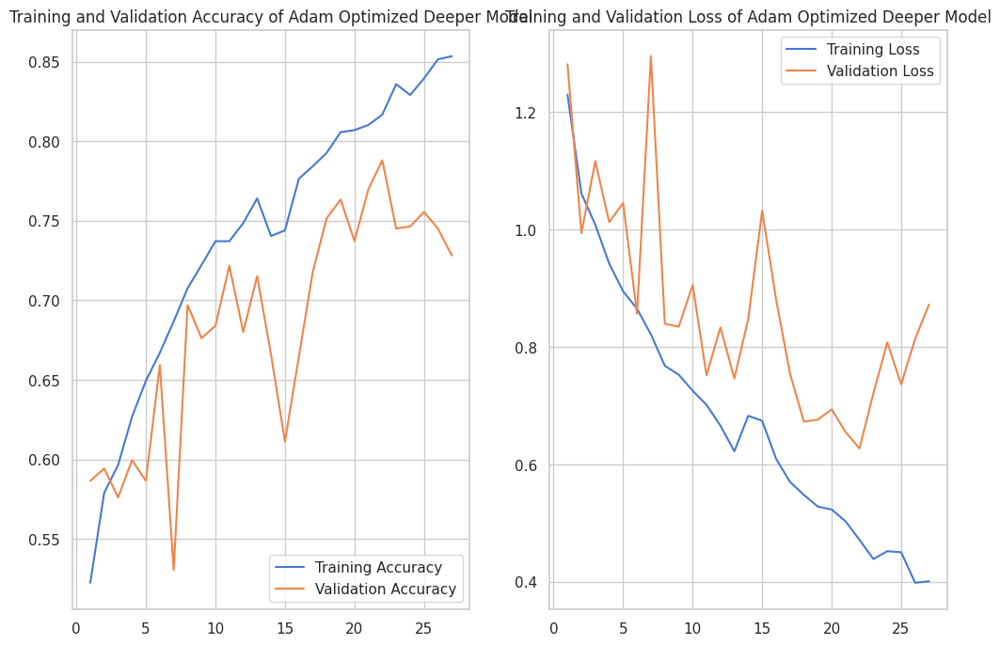

In [60]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']


epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy of Adam Optimized Deeper Model')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss of Adam Optimized Deeper Model')
plt.show()

In [61]:
test_loss, test_accuracy = cnn_model2.evaluate(val_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - accuracy: 0.7091 - loss: 0.9604
Test Loss: 0.8724721074104309
Test Accuracy: 0.7282184362411499


14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - accuracy: 0.7193 - loss: 0.9071
Test Loss: 0.8528411984443665
Test Accuracy: 0.734883725643158
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


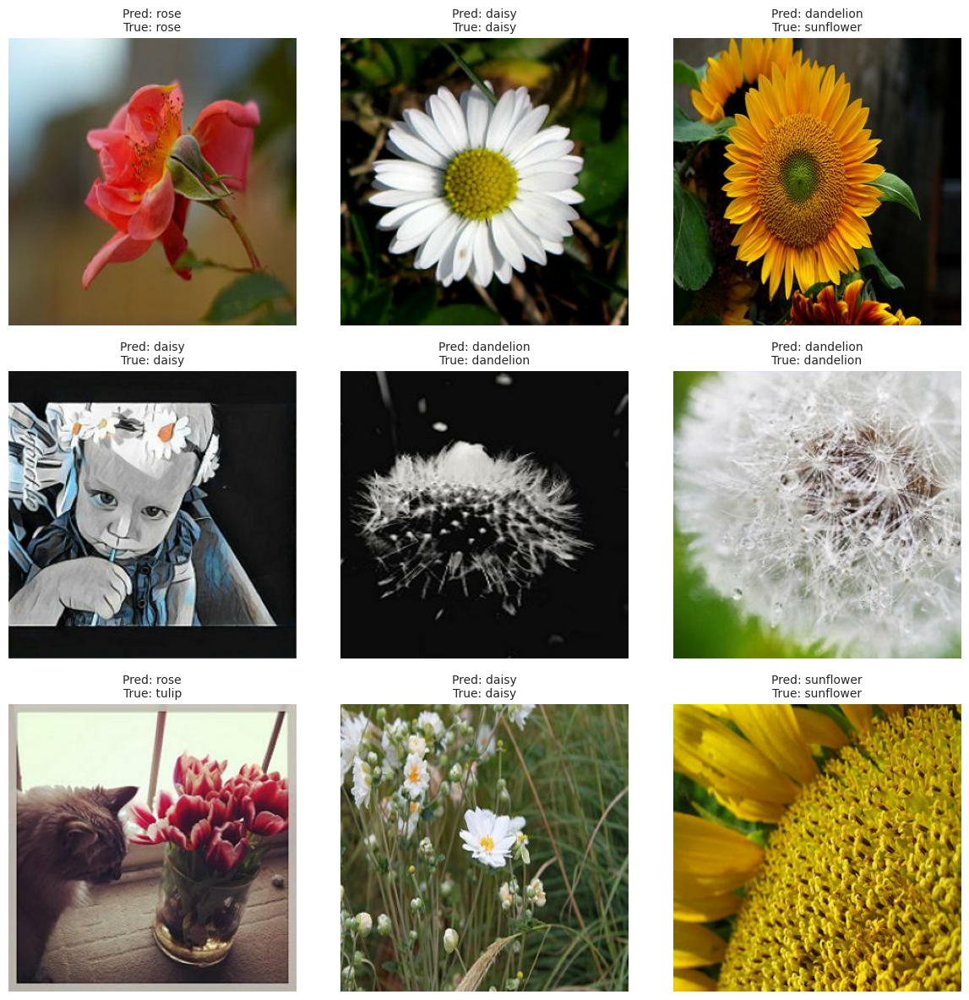

In [62]:


def predict_and_plot(model, dataset, class_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):

        predictions = model.predict(images)
        images = images.numpy()
        labels = labels.numpy()

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].astype("uint8"))

            predicted_label = class_names[np.argmax(predictions[i])]


            true_label_index = np.argmax(labels[i])
            true_label = class_names[true_label_index]

            plt.title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()


test_loss, test_accuracy = cnn_model2.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)


predict_and_plot(cnn_model2, test_ds, class_names)


In [63]:
cnn_model2.save('cnn_model_adam.h5')

In [64]:
loaded_model = keras.models.load_model('cnn_model_adam.h5')
print("Model loaded for predictions")


all_images = []
all_labels = []
for images, labels in test_ds:
    all_images.append(images.numpy())
    all_labels.append(labels.numpy())


test_images = np.concatenate(all_images, axis=0)
test_labels_onehot = np.concatenate(all_labels, axis=0)


predictions = loaded_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_labels_onehot
if true_labels.ndim > 1:
    true_labels = np.argmax(true_labels, axis=1)


print(f"Class names: {class_names}")


report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", report)

Model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step
Class names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Report:
               precision    recall  f1-score   support

       daisy       0.82      0.71      0.76        76
   dandelion       0.78      0.88      0.83       105
        rose       0.62      0.71      0.66        78
   sunflower       0.72      0.86      0.79        73
       tulip       0.74      0.53      0.62        98

    accuracy                           0.73       430
   macro avg       0.74      0.74      0.73       430
weighted avg       0.74      0.73      0.73       430



## Transfer Learning using RESNET model

In [65]:
train_ds = train_ds = tf.keras.utils.image_dataset_from_directory(
resized_train_ds_path,
batch_size=32,
image_size=(256, 256),
shuffle=True,
seed=123,
validation_split=0.2,
subset="training",
)

Found 3847 files belonging to 5 classes.
Using 3078 files for training.


In [66]:
val_ds = train_ds = tf.keras.utils.image_dataset_from_directory(
resized_train_ds_path,
batch_size=32,
image_size=(256, 256),
shuffle=True,
seed=123,
validation_split=0.2,
subset="validation",
)

Found 3847 files belonging to 5 classes.
Using 769 files for validation.


In [67]:
train_ds = train_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))
val_ds = val_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))

In [68]:

resnet_model = Sequential()

pretrained_model= tf.keras.applications.ResNet50(include_top=False,
                   input_shape=(256,256,3),
                   pooling='avg',classes=5,
                   weights='imagenet')
for layer in pretrained_model.layers:
        layer.trainable=False

resnet_model.add(pretrained_model)
resnet_model.add(layers.Flatten())
resnet_model.add(layers.Dense(512, activation='relu'))
resnet_model.add(layers.Dropout(0.5)),
resnet_model.add(layers.BatchNormalization()),
resnet_model.add(layers.Dense(5, activation='softmax'))

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [69]:
resnet_model.compile(optimizer=Adam(learning_rate=0.001),loss='categorical_crossentropy',metrics=['accuracy'])

In [70]:
resnet_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,641,413 (94.00 MB)

 Trainable params: 1,052,677 (4.02 MB)

 Non-trainable params: 23,588,736 (89.98 MB)

In [71]:
epochs=20
history = resnet_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 35s 670ms/step - accuracy: 0.5404 - loss: 1.2618 - val_accuracy: 0.8309 - val_loss: 0.4907
Epoch 2/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 313ms/step - accuracy: 0.8579 - loss: 0.4167 - val_accuracy: 0.9285 - val_loss: 0.1903
Epoch 3/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 212ms/step - accuracy: 0.9165 - loss: 0.2418 - val_accuracy: 0.9688 - val_loss: 0.0992
Epoch 4/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 238ms/step - accuracy: 0.9562 - loss: 0.1692 - val_accuracy: 0.9818 - val_loss: 0.0821
Epoch 5/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 217ms/step - accuracy: 0.9758 - loss: 0.1228 - val_accuracy: 0.9948 - val_loss: 0.0520
Epoch 6/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 211ms/step - accuracy: 0.9824 - loss: 0.0840 - val_accuracy: 0.9987 - val_loss: 0.0380
Epoch 7/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 206ms/step - accuracy: 0.9769 - loss: 0.0903 - val_accuracy: 0.9987 - val_loss: 0.0344
Epoch 8/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 313ms/step - accuracy: 0.9771 - loss: 0.0705 - val_accuracy

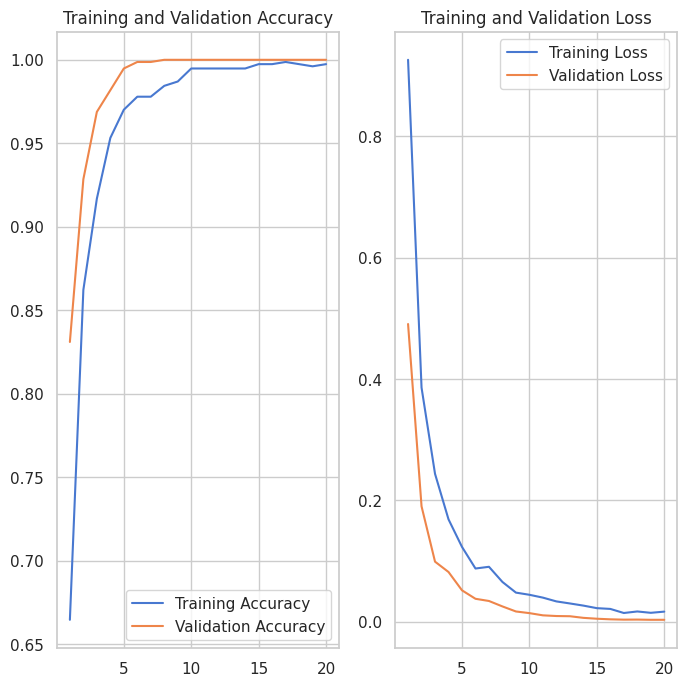

In [72]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']


epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [73]:
test_loss, test_accuracy = resnet_model.evaluate(val_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 1.0000 - loss: 0.0035
Test Loss: 0.0034008524380624294
Test Accuracy: 1.0


Found 430 files belonging to 5 classes.
14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 332ms/step - accuracy: 0.8674 - loss: 0.4005
Test Loss: 0.47054874897003174
Test Accuracy: 0.8534883856773376
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


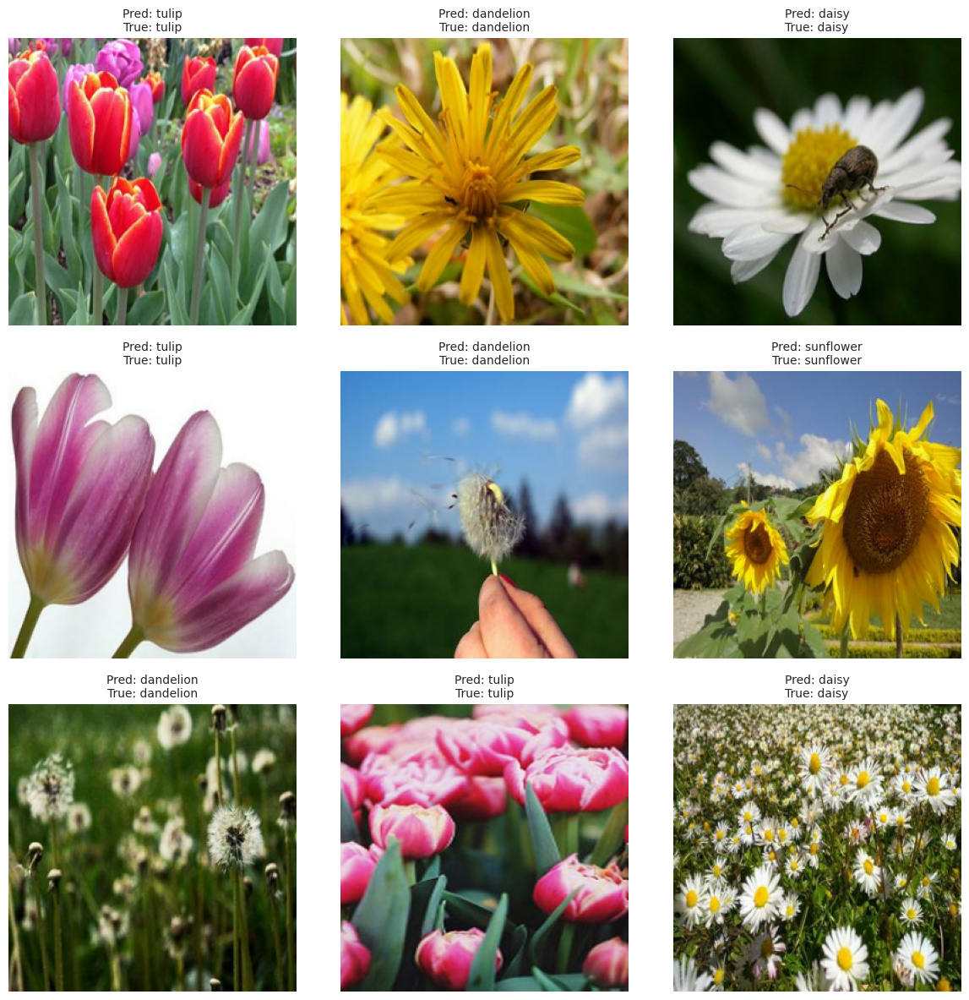

In [75]:


def predict_and_plot(model, dataset, class_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):

        predictions = model.predict(images)
        images = images.numpy()
        labels = labels.numpy()

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].astype("uint8"))

            predicted_label = class_names[np.argmax(predictions[i])]


            true_label_index = np.argmax(labels[i])
            true_label = class_names[true_label_index]
            plt.title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()


test_dir = "/content/drive/MyDrive/Image CNN/test"
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    batch_size=32,
    image_size=(256, 256),
    shuffle=True
)

test_ds = test_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))


test_loss, test_accuracy = resnet_model.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)


predict_and_plot(resnet_model, test_ds, class_names)


In [76]:
resnet_model.save('cnn_transferlearning_model.h5')

In [77]:
loaded_model = keras.models.load_model('cnn_transferlearning_model.h5')
print("Model loaded for predictions")


all_images = []
all_labels = []
for images, labels in test_ds:
    all_images.append(images.numpy())
    all_labels.append(labels.numpy())


test_images = np.concatenate(all_images, axis=0)
test_labels_onehot = np.concatenate(all_labels, axis=0)


predictions = loaded_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_labels_onehot
if true_labels.ndim > 1:
    true_labels = np.argmax(true_labels, axis=1)


print(f"Class names: {class_names}")




report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", report)

Model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 8s 361ms/step
Class names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Report:
               precision    recall  f1-score   support

       daisy       0.84      0.83      0.83        76
   dandelion       0.86      0.90      0.88       105
        rose       0.82      0.81      0.81        78
   sunflower       0.90      0.86      0.88        73
       tulip       0.85      0.86      0.85        98

    accuracy                           0.85       430
   macro avg       0.85      0.85      0.85       430
weighted avg       0.85      0.85      0.85       430

